<div style="background-color:lightgreen; border-style: dotted;border-color: yellow;text-align:center;color:blue;font-size:20px;border-radius: 50px;padding: 20px 20px;">
<strong> pyQSAR   (2023.11) <br>
    <br>
 chemoinformatics Lab., Soongsil University, Seoul, Korea<br>
    </strong></div>

## Developers
Sinyoung Kim, Sunghyun Moon, Minhyeong Kim, and Kwang-Hwi Cho (chokh@ssu.ac.kr)<br>

## Revision History
|Year| Date | Description |
|---|:---|:---|
|2017| December 27 | Created |
|2020| April 25    | migrated to python3 |
|2021| November 16 | Add Genetic Algorithm |
|2022| Feburary 28 | Add Clustering Algorithm (K-Means, S.O.M) |
|2023| November 16 | Filtering for Mordred, SDF generation, data split (Random or Block) |


## Tested Python Package 
| Package Name | version | Description |
|:--|:--|:--|
|  python | 3.9.16| |
| bokeh |2.4.3| |
| ipywidgets |8.0.2| |
| IPython | 7.31.1 | |
| matplotlib |3.3.4| | 
| numpy  | 1.24.2 | |
|  pandas | 1.5.3 | |
| PIL | 8.2.0| |
| py3Dmol | 2.0.3||
| plotly| 5.6.0| |
| pubchempy | 1.0.4 | |
| rdkit | 2022.09.5 | 2022.02 Rdkit doesn't works with version 3.8 or higher|
| scipy |1.10.1 | | |
| seaborn |0.11.1 | |
|  sklearn | 1.2.2| | |


In [1]:
#from pyqsar import data_setting as ds
from pyqsar import data_tools as dt
from pyqsar import model_tools as mt
from pyqsar import draw_mol
import pandas as pd
import numpy as np

In [2]:
dt.VCHECK()

pyqsar: 2023-11-20
Numpy : 1.24.2
Scipy : 1.10.1
pandas : 1.5.3
RDkit : 2022.09.5
sklearn : 1.2.2
bokeh : 2.4.3
py3Dmol : 2.0.3
IPython : 7.31.1
ipywidgets : 8.0.2
pubchempy : 1.0.4


In [3]:
## Set the maximum number of rows and columns you want to see in a data frame
#pd.set_option('display.max_rows',None)
#pd.set_option('display.max_columns',None)

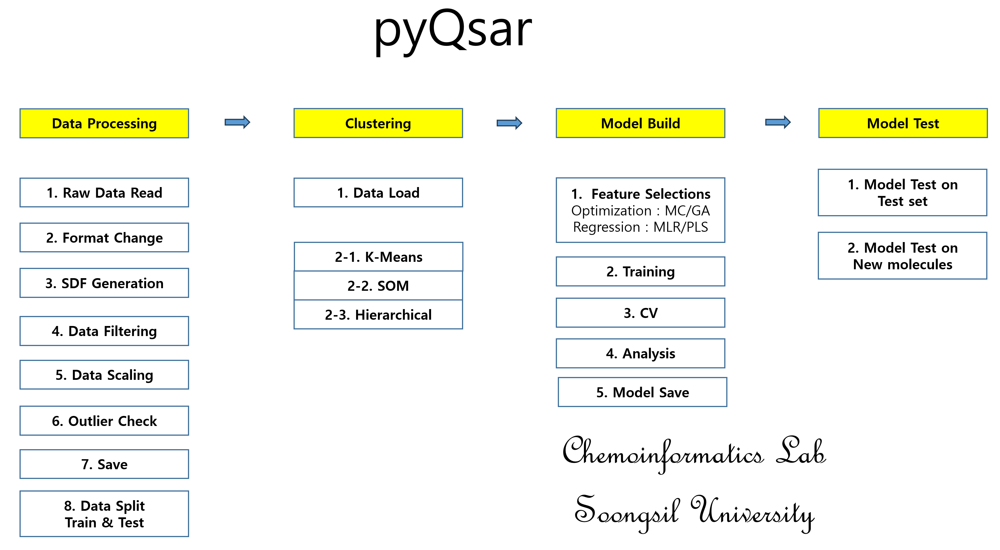

In [4]:
dt.man('pyQsar.PNG')

In [5]:
# OLD : needs modification
#dt.man('workflow.png')

<h1>1. Data processing</h1>
<h2>1.1. Raw Data Read</h2>
<ul>
<li> the sample data(qdb.csv) is taken from 
<a href="https://qsardb.org/repository/handle/10967/229">qsarDB</a> </li>
<li> Training set(194) and Test set(98) are combined to make qdb.csv(292).</li>
<li> Then, descriptors are calculated using mordred.</li>
</ul>

In [6]:
orgFormat = pd.read_csv("qdb.csv") 
orgFormat

,Name,Cid,Smiles,logLC50,ABC,ABCGG,nAcid,nBase,SpAbs_A,SpMax_A,...,SRW10,TSRW10,MW,AMW,WPath,WPol,Zagreb1,Zagreb2,mZagreb1,mZagreb2
0,m001,11859,C1=C(C=C(C(=C1Cl)Cl)Cl)O,-5.46,7.427747,7.188678,0,0,11.643052,2.307250,...,9.078065,39.748909,195.924948,15.071150,110,13,48.0,54.0,4.944444,2.222222
1,m002,11899,C1=CC(=C(C=C1Cl)Cl)[N+](=O)[O-],-4.66,8.134854,7.770338,0,0,12.675204,2.302776,...,9.094144,41.023148,190.954084,13.639577,150,14,52.0,58.0,5.194444,2.472222
2,m003,2723704,CNC(=S)N,-3.98,3.047207,3.305183,0,0,5.226252,1.847759,...,6.834109,27.254130,90.025169,8.184106,18,2,16.0,14.0,3.361111,1.333333
3,m004,3032338,CCNC(=S)N,-4.00,3.754314,4.057055,0,0,6.155367,1.902113,...,7.131699,29.439488,104.040819,7.431487,32,3,20.0,18.0,3.611111,1.583333
4,m005,2346,C1=CC=C(C=C1)CN=C=S,-6.54,7.071068,6.547760,0,0,12.932143,2.154341,...,8.438366,38.130322,149.029920,8.766466,133,9,42.0,44.0,3.111111,2.500000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
287,m288,15292,CC1=CC(=CC(=C1O)Cl)Cl,-5.65,7.427747,7.188678,0,0,11.643052,2.307250,...,9.078065,39.748909,175.979570,10.998723,110,13,48.0,54.0,4.944444,2.222222
288,m289,15767,COC1=C(C(=C(C(=C1Cl)Cl)Cl)Cl)Cl,-7.01,9.496696,9.522267,0,0,15.688761,2.426720,...,9.602855,44.616134,277.862653,17.366416,220,23,64.0,77.0,6.916667,3.000000
289,m290,1551919,CCCCNC(=S)N,-3.85,5.168527,5.361851,0,0,8.762573,1.949856,...,7.475906,33.090360,132.072119,6.603606,79,5,28.0,26.0,4.111111,2.083333
290,m291,2566,CC1(CC2=C(O1)C(=CC=C2)OC(=O)NC)C,-6.52,12.367162,11.107564,0,0,19.625463,2.470049,...,9.709599,62.929068,221.105193,7.132426,425,22,84.0,97.0,6.256944,3.472222


<h2>1.2. format change</h2>
<ul>
<li> pyQsar needs the data with the following orders </li>
<li> "ID",  "EP",  "SMI", ~Descriptors~~~~ </li>
<li> "ID" = index or name, "EP" = End Point, "SMI" = smiles code</li>
</ul>

In [7]:
changed = orgFormat.rename(columns={'Smiles': 'SMI', 'Cid': 'ID', "logLC50" : "EP"})
newFormat = changed[["ID", "EP", "SMI"]+ list(changed.columns)[4:]]
newFormat.to_csv("qdb1.csv", index=False)
newFormat

,ID,EP,SMI,ABC,ABCGG,nAcid,nBase,SpAbs_A,SpMax_A,SpDiam_A,...,SRW10,TSRW10,MW,AMW,WPath,WPol,Zagreb1,Zagreb2,mZagreb1,mZagreb2
0,11859,-5.46,C1=C(C=C(C(=C1Cl)Cl)Cl)O,7.427747,7.188678,0,0,11.643052,2.307250,4.614501,...,9.078065,39.748909,195.924948,15.071150,110,13,48.0,54.0,4.944444,2.222222
1,11899,-4.66,C1=CC(=C(C=C1Cl)Cl)[N+](=O)[O-],8.134854,7.770338,0,0,12.675204,2.302776,4.605551,...,9.094144,41.023148,190.954084,13.639577,150,14,52.0,58.0,5.194444,2.472222
2,2723704,-3.98,CNC(=S)N,3.047207,3.305183,0,0,5.226252,1.847759,3.695518,...,6.834109,27.254130,90.025169,8.184106,18,2,16.0,14.0,3.361111,1.333333
3,3032338,-4.00,CCNC(=S)N,3.754314,4.057055,0,0,6.155367,1.902113,3.804226,...,7.131699,29.439488,104.040819,7.431487,32,3,20.0,18.0,3.611111,1.583333
4,2346,-6.54,C1=CC=C(C=C1)CN=C=S,7.071068,6.547760,0,0,12.932143,2.154341,4.308683,...,8.438366,38.130322,149.029920,8.766466,133,9,42.0,44.0,3.111111,2.500000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
287,15292,-5.65,CC1=CC(=CC(=C1O)Cl)Cl,7.427747,7.188678,0,0,11.643052,2.307250,4.614501,...,9.078065,39.748909,175.979570,10.998723,110,13,48.0,54.0,4.944444,2.222222
288,15767,-7.01,COC1=C(C(=C(C(=C1Cl)Cl)Cl)Cl)Cl,9.496696,9.522267,0,0,15.688761,2.426720,4.853440,...,9.602855,44.616134,277.862653,17.366416,220,23,64.0,77.0,6.916667,3.000000
289,1551919,-3.85,CCCCNC(=S)N,5.168527,5.361851,0,0,8.762573,1.949856,3.899712,...,7.475906,33.090360,132.072119,6.603606,79,5,28.0,26.0,4.111111,2.083333
290,2566,-6.52,CC1(CC2=C(O1)C(=CC=C2)OC(=O)NC)C,12.367162,11.107564,0,0,19.625463,2.470049,4.778732,...,9.709599,62.929068,221.105193,7.132426,425,22,84.0,97.0,6.256944,3.472222


<h2>1.3. Generating SDF</h2>
<ul>
<li> Generates SDF from SMILES for future use </li>
</ul>

In [8]:
dt.SDFgeneration()

Path :/home/lab00/chemotic/pyqsar3_1
Index   File Name
   0    qdb.csv
   1    qdb1.csv
Enter .csv file index to load : 1


          ID    EP                               SMI
0      11859 -5.46          C1=C(C=C(C(=C1Cl)Cl)Cl)O
1      11899 -4.66   C1=CC(=C(C=C1Cl)Cl)[N+](=O)[O-]
2    2723704 -3.98                          CNC(=S)N
3    3032338 -4.00                         CCNC(=S)N
4       2346 -6.54               C1=CC=C(C=C1)CN=C=S
..       ...   ...                               ...
287    15292 -5.65             CC1=CC(=CC(=C1O)Cl)Cl
288    15767 -7.01   COC1=C(C(=C(C(=C1Cl)Cl)Cl)Cl)Cl
289  1551919 -3.85                       CCCCNC(=S)N
290     2566 -6.52  CC1(CC2=C(O1)C(=CC=C2)OC(=O)NC)C
291    13905 -3.63           CCNC1=NC(=NC(=N1)SC)NCC

[292 rows x 3 columns]


/home/lab00/chemotic/pyqsar3_1/pyqsar/data_tools.py:600: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  smi_df['Molecule'] = smi_df['SMI'].apply(Chem.MolFromSmiles)


<h2>1.4.  Data Filtering</h2>
<ul>
<li> eliminating non-numerical data </li>
</ul>

In [9]:
X_data = newFormat.iloc[:,3:]
X_data

,ABC,ABCGG,nAcid,nBase,SpAbs_A,SpMax_A,SpDiam_A,SpAD_A,SpMAD_A,LogEE_A,...,SRW10,TSRW10,MW,AMW,WPath,WPol,Zagreb1,Zagreb2,mZagreb1,mZagreb2
0,7.427747,7.188678,0,0,11.643052,2.307250,4.614501,11.643052,1.164305,3.206363,...,9.078065,39.748909,195.924948,15.071150,110,13,48.0,54.0,4.944444,2.222222
1,8.134854,7.770338,0,0,12.675204,2.302776,4.605551,12.675204,1.152291,3.294669,...,9.094144,41.023148,190.954084,13.639577,150,14,52.0,58.0,5.194444,2.472222
2,3.047207,3.305183,0,0,5.226252,1.847759,3.695518,5.226252,1.045250,2.408576,...,6.834109,27.254130,90.025169,8.184106,18,2,16.0,14.0,3.361111,1.333333
3,3.754314,4.057055,0,0,6.155367,1.902113,3.804226,6.155367,1.025895,2.595100,...,7.131699,29.439488,104.040819,7.431487,32,3,20.0,18.0,3.611111,1.583333
4,7.071068,6.547760,0,0,12.932143,2.154341,4.308683,12.932143,1.293214,3.179653,...,8.438366,38.130322,149.029920,8.766466,133,9,42.0,44.0,3.111111,2.500000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
287,7.427747,7.188678,0,0,11.643052,2.307250,4.614501,11.643052,1.164305,3.206363,...,9.078065,39.748909,175.979570,10.998723,110,13,48.0,54.0,4.944444,2.222222
288,9.496696,9.522267,0,0,15.688761,2.426720,4.853440,15.688761,1.206828,3.465917,...,9.602855,44.616134,277.862653,17.366416,220,23,64.0,77.0,6.916667,3.000000
289,5.168527,5.361851,0,0,8.762573,1.949856,3.899712,8.762573,1.095322,2.887985,...,7.475906,33.090360,132.072119,6.603606,79,5,28.0,26.0,4.111111,2.083333
290,12.367162,11.107564,0,0,19.625463,2.470049,4.778732,19.625463,1.226591,3.704782,...,9.709599,62.929068,221.105193,7.132426,425,22,84.0,97.0,6.256944,3.472222


In [10]:
X_data, sel_desc=dt.NonNumricFilter(X_data)

Start :  (292, 1826)
Filterd : (292, 952)


In [11]:
filtered = newFormat[["ID","EP","SMI"]+sel_desc]
filtered.to_csv("qdb1_F.csv", index=False)
filtered

,ID,EP,SMI,ABC,ABCGG,nAcid,nBase,SpAbs_A,SpMax_A,SpDiam_A,...,SRW10,TSRW10,MW,AMW,WPath,WPol,Zagreb1,Zagreb2,mZagreb1,mZagreb2
0,11859,-5.46,C1=C(C=C(C(=C1Cl)Cl)Cl)O,7.427747,7.188678,0,0,11.643052,2.307250,4.614501,...,9.078065,39.748909,195.924948,15.071150,110,13,48.0,54.0,4.944444,2.222222
1,11899,-4.66,C1=CC(=C(C=C1Cl)Cl)[N+](=O)[O-],8.134854,7.770338,0,0,12.675204,2.302776,4.605551,...,9.094144,41.023148,190.954084,13.639577,150,14,52.0,58.0,5.194444,2.472222
2,2723704,-3.98,CNC(=S)N,3.047207,3.305183,0,0,5.226252,1.847759,3.695518,...,6.834109,27.254130,90.025169,8.184106,18,2,16.0,14.0,3.361111,1.333333
3,3032338,-4.00,CCNC(=S)N,3.754314,4.057055,0,0,6.155367,1.902113,3.804226,...,7.131699,29.439488,104.040819,7.431487,32,3,20.0,18.0,3.611111,1.583333
4,2346,-6.54,C1=CC=C(C=C1)CN=C=S,7.071068,6.547760,0,0,12.932143,2.154341,4.308683,...,8.438366,38.130322,149.029920,8.766466,133,9,42.0,44.0,3.111111,2.500000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
287,15292,-5.65,CC1=CC(=CC(=C1O)Cl)Cl,7.427747,7.188678,0,0,11.643052,2.307250,4.614501,...,9.078065,39.748909,175.979570,10.998723,110,13,48.0,54.0,4.944444,2.222222
288,15767,-7.01,COC1=C(C(=C(C(=C1Cl)Cl)Cl)Cl)Cl,9.496696,9.522267,0,0,15.688761,2.426720,4.853440,...,9.602855,44.616134,277.862653,17.366416,220,23,64.0,77.0,6.916667,3.000000
289,1551919,-3.85,CCCCNC(=S)N,5.168527,5.361851,0,0,8.762573,1.949856,3.899712,...,7.475906,33.090360,132.072119,6.603606,79,5,28.0,26.0,4.111111,2.083333
290,2566,-6.52,CC1(CC2=C(O1)C(=CC=C2)OC(=O)NC)C,12.367162,11.107564,0,0,19.625463,2.470049,4.778732,...,9.709599,62.929068,221.105193,7.132426,425,22,84.0,97.0,6.256944,3.472222


## Check if there are descriptors with one value

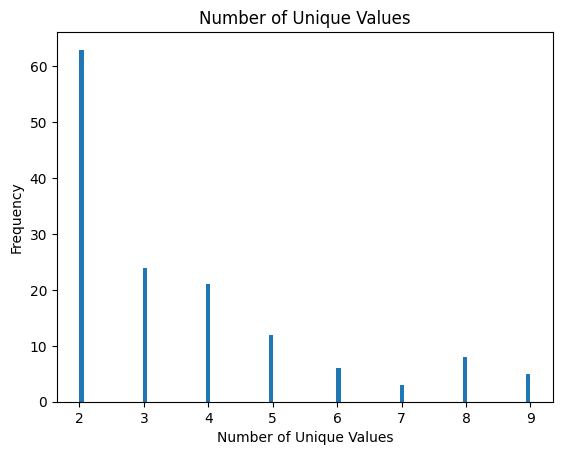

In [12]:
dt.uCheck(filtered)

<h2>1.5.  Data scaling</h2>
<h3> ScalingTools(scale, ext='.csv') </h3>
<ul>
<li> scale : Scaling Method, 'minmax','standard' </li>
<li> ext : call csv format file with ext extension' </li>
</ul>

In [13]:
st = dt.ScalingTools(scale='standard')

Path :/home/lab00/chemotic/pyqsar3_1
Index   File Name
   0    qdb.csv
   1    qdb1.csv
   2    qdb1_F.csv
Enter .csv file index to load : 2




<h3> train_scaler() </h3>
<ul>
<li> * fit and transform data </li>
<li> * save scaler file to use in model information </li>
</ul>    

In [14]:
st.train_scaler()

Scaler File : qdb1_F_standard.info file saved


,ID,EP,SMI,ABC,ABCGG,nAcid,nBase,SpAbs_A,SpMax_A,SpDiam_A,...,SRW10,TSRW10,MW,AMW,WPath,WPol,Zagreb1,Zagreb2,mZagreb1,mZagreb2
0,11859,-5.46,C1=C(C=C(C(=C1Cl)Cl)Cl)O,-0.151062,-0.093948,-0.117851,-0.162791,-0.257506,0.465983,0.541285,...,0.420833,-0.102373,0.159083,0.948995,-0.374862,-0.050123,-0.111334,-0.087220,0.080589,-0.324793
1,11899,-4.66,C1=CC(=C(C=C1Cl)Cl)[N+](=O)[O-],0.008807,0.063539,-0.117851,-0.162791,-0.112802,0.449525,0.524199,...,0.432253,-0.000520,0.102523,0.676300,-0.284085,0.044915,0.016656,0.015890,0.196860,-0.113150
2,2723704,-3.98,CNC(=S)N,-1.141451,-1.145427,-0.117851,-0.162791,-1.157113,-1.223984,-1.213185,...,-1.173080,-1.101110,-1.045867,-0.362894,-0.583651,-1.095539,-1.135254,-1.118326,-0.655795,-1.077300
3,3032338,-4.00,CCNC(=S)N,-0.981582,-0.941853,-0.117851,-0.162791,-1.026855,-1.024075,-1.005646,...,-0.961698,-0.926429,-0.886394,-0.506258,-0.551879,-1.000502,-1.007264,-1.015215,-0.539523,-0.865657
4,2346,-6.54,C1=CC=C(C=C1)CN=C=S,-0.231703,-0.267480,-0.117851,-0.162791,-0.076781,-0.096403,-0.042566,...,-0.033554,-0.231750,-0.374499,-0.251963,-0.322665,-0.430274,-0.303319,-0.344997,-0.772066,-0.089634
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
287,15292,-5.65,CC1=CC(=CC(=C1O)Cl)Cl,-0.151062,-0.093948,-0.117851,-0.162791,-0.257506,0.465983,0.541285,...,0.420833,-0.102373,-0.067860,0.173252,-0.374862,-0.050123,-0.111334,-0.087220,0.080589,-0.324793
288,15767,-7.01,COC1=C(C(=C(C(=C1Cl)Cl)Cl)Cl)Cl,0.316703,0.537885,-0.117851,-0.162791,0.309685,0.905381,0.997454,...,0.793598,0.286676,1.091388,1.386213,-0.125224,0.900256,0.400626,0.505665,0.997839,0.333651
289,1551919,-3.85,CCCCNC(=S)N,-0.661845,-0.588572,-0.117851,-0.162791,-0.661337,-0.848482,-0.823350,...,-0.717203,-0.634606,-0.567448,-0.663959,-0.445215,-0.810426,-0.751284,-0.808994,-0.306981,-0.442372
290,2566,-6.52,CC1(CC2=C(O1)C(=CC=C2)OC(=O)NC)C,0.965682,0.967113,-0.117851,-0.162791,0.861594,1.064743,0.854826,...,0.869420,1.750471,0.445589,-0.563225,0.340012,0.805218,1.040576,1.021218,0.691012,0.733421


<h2>1.6.  Outlier Check - You can Skip this part!</h2>
<h3> 1.6.1. check_outlier(standard) - You can Skip! </h3>
<ul>
<li> * Check outlier value in data </li>
<li> * See with histogram, and delete if you want </li>
</ul>    

In [15]:
data = st.check_outlier(9)

interactive(children=(Dropdown(description='Descriptor', options=('nBase', 'VR1_A', 'VR2_A', 'nBridgehead', 'n…

<h3> 1.6.2. dt.outplot(figsize=(2000,2000)) - You can skip! </h3>

* Open File which ext is .out, show histogram of outlier molecule and scatter plot 
* Can Choose File by input index number 
* figsize= (default) (2000,2000) : (weight, height) 
* Return 
   output, dictionary type data   
 ** To import image about outlier index plot, requires the kaleido package : pip install -U kaleido 


In [16]:
st.outplot()

/home/lab00/chemotic/pyqsar3_1
File Index   File Name
0            qdb1_F_standard_9.out
Enter File Index Num of Above List : 0
qdb1_F_standard_9.out is selected


interactive(children=(Dropdown(description='ID:', options=('11712', '12358480', '1269845', '12901', '13218779'…

<h2> 1.7. Save Scaled Data </h2>

In [17]:
st.save()

File name to save scaling as
(default) qdb1_F_s.csv

-
qdb1_F_s.csv is saved




<h2>1.8. Data Split</h2>
<h3> split data into training and test sets </h3>
<h3> data_split('.csv, test_num, Block) </h3>
    * test_num : number of test molecules, the rest of them is training date <br>
    * Random : True : select test_num molecues randomly<br>
               False : take test_num molecues from the end of the data 
                

In [54]:
dt.data_split('.csv',test_num=98, Random=False)

Path :/home/lab00/chemotic/pyqsar3_1
Index   File Name
   0    qdb.csv
   1    qdb1.csv
   2    qdb1_F.csv
   3    qdb1_F_s.csv
Enter .csv file index to load : 3


Total : 292
Train : qdb1_F_s_B.train 194
Test  : qdb1_F_s_B.test 98


<h1> 2. Clustering</h1>
<h2> 2.1. Data Load </h2>
 * Split data by [descriptor, EP] set from train/test files 
   

In [22]:
# You can restart from here
from pyqsar import data_tools as dt
from pyqsar import model_tools as mt
from pyqsar import draw_mol
import pandas as pd
import numpy as np

In [37]:
X_train, y_train = mt.split_xy('.train')

Path :/home/lab00/chemotic/pyqsar3_1
Index   File Name
   0    qdb1_F_s.train
   1    qdb1_F_s_B.train
Enter .train file index to load : 0




<h1> 2.2-1. KMeans</h1>
<h2> mt.FeatureCluster_KMeans(train_Data, K value=500, init='k-means++', algorithm='auto') : Apply KMeans Class </h2>

    * qstart = saved file name of clust info
    * K value = # cluster (default) 500
    * init = mthod of finding centroid 
        Possible : (default)'k-means++', 'random' = select centroid randomly in rows
    * algorithm
        Possible : (default)'auto', 'elkan', 'full'
            full : classical EM(expectaion maximization) algorithm => appropriate sparse data
            elkan : appropriate dense data
            auto : automatically select according to the data, usually choose elkan
    clust = fit KMeans(train_data, K) Model 
    set_cluster = get cluster value as array
    cluster_dist = clust evaluation by histogram
    model_evaluation = clust evaluation by silhouette score
         0 : cluster overlapped
         1 : clustering well
        -1 : clustering bad  

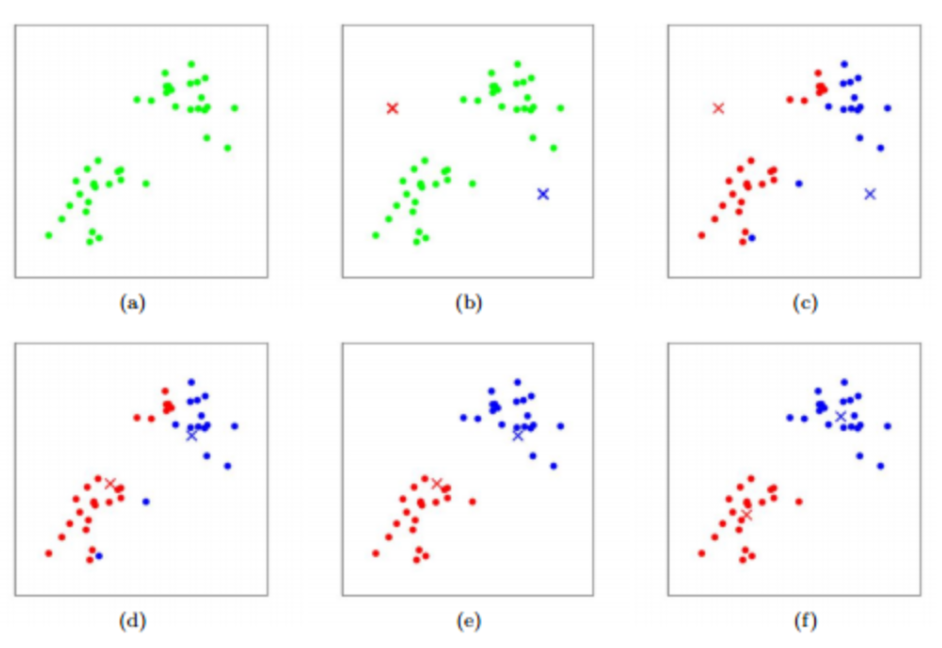

In [24]:
dt.man('kmeans.png')

In [25]:
# KMeans Clustering 
clust = mt.FeatureCluster_KMeans(X_train,400,init='k-means++',algorithm='auto')
clust_info = clust.set_cluster()

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7f043e2dcf70>
Traceback (most recent call last):
  File "/share/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/share/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/share/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/share/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'
Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7f043e2dcf70>
Traceback (most recent call last):
  File "/share/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/share/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/share/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/share/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'



 Cluster 0 ['SM1_Dzse', 'SM1_Dzpe', 'SM1_Dzare', 'SM1_Dzi'] 
 Cluster 1 ['ATS1Z', 'ATS1m', 'Xp-0dv', 'SZ', 'Sm', 'ETA_alpha', 'ZMIC0', 'LabuteASA', 'MW'] 
 Cluster 2 ['FilterItLogS'] 
 Cluster 3 ['Xch-7dv', 'nARing'] 
 Cluster 4 ['NdssS', 'SdssS', 'n7Ring', 'n7HRing', 'n7ARing', 'n7AHRing', 'n8FRing', 'n12FRing', 'n8FHRing', 'n12FHRing', 'n8FARing', 'n12FARing', 'n8FAHRing', 'n12FAHRing'] 
 Cluster 5 ['nAtom', 'ATS0se', 'ATS1se', 'ATS2se', 'ATS3se', 'ATS0pe', 'ATS1pe', 'ATS2pe', 'ATS3pe', 'ATS0are', 'ATS1are', 'ATS2are', 'ATS3are', 'ATS0i', 'ATS1i', 'ATSC0i', 'nBonds', 'Sse', 'Spe', 'Sare', 'Si', 'TIC0'] 
 Cluster 6 ['SIC3', 'SIC4', 'SIC5', 'BIC3', 'BIC4', 'BIC5'] 
 Cluster 7 ['SpAbs_Dzse', 'SpMax_Dzse', 'SpDiam_Dzse', 'SpAD_Dzse', 'LogEE_Dzse', 'SpAbs_Dzpe', 'SpMax_Dzpe', 'SpDiam_Dzpe', 'SpAD_Dzpe', 'LogEE_Dzpe', 'SpAbs_Dzare', 'SpMax_Dzare', 'SpDiam_Dzare', 'SpAD_Dzare', 'LogEE_Dzare', 'SpAbs_Dzi', 'SpMax_Dzi', 'SpDiam_Dzi', 'SpAD_Dzi', 'LogEE_Dzi', 'SpAbs_D', 'SpMax_D', 'SpDiam_D',

 Cluster 258 ['AXp-0dv'] 
 Cluster 259 ['nRot'] 
 Cluster 260 ['ATSC7d'] 
 Cluster 261 ['ETA_psi_1'] 
 Cluster 262 ['AATSC0se', 'AATSC0pe'] 
 Cluster 263 ['ATSC8c'] 
 Cluster 264 ['ATSC4v'] 
 Cluster 265 ['ATSC2v', 'ATSC2p'] 
 Cluster 266 ['SMR_VSA9'] 
 Cluster 267 ['Xpc-4d', 'Xpc-5d', 'GGI2', 'GGI3'] 
 Cluster 268 ['NdssC'] 
 Cluster 269 ['PEOE_VSA7'] 
 Cluster 270 ['AATS0Z', 'AATS0m'] 
 Cluster 271 ['ATSC6d'] 
 Cluster 272 ['VSA_EState8'] 
 Cluster 273 ['BCUTc-1h'] 
 Cluster 274 ['MIC0'] 
 Cluster 275 ['ATSC1se', 'ATSC1pe', 'ATSC1are'] 
 Cluster 276 ['AATSC2se', 'AATSC2pe', 'AATSC2are'] 
 Cluster 277 ['JGI4'] 
 Cluster 278 ['ETA_eta', 'ETA_eta_L'] 
 Cluster 279 ['ATSC4c'] 
 Cluster 280 ['NdsN', 'SdsN'] 
 Cluster 281 ['GATS2s'] 
 Cluster 282 ['ATSC0p', 'bpol'] 
 Cluster 283 ['ETA_dAlpha_B'] 
 Cluster 284 ['BCUTd-1h'] 
 Cluster 285 ['nN', 'MID_N'] 
 Cluster 286 ['GATS2i'] 
 Cluster 287 ['SpAbs_A', 'SpAD_A', 'nHeavyAtom', 'ATS0d', 'VR1_DzZ', 'VR1_Dzm', 'VR1_Dzv', 'VR1_Dzse', 'VR1_Dzpe',

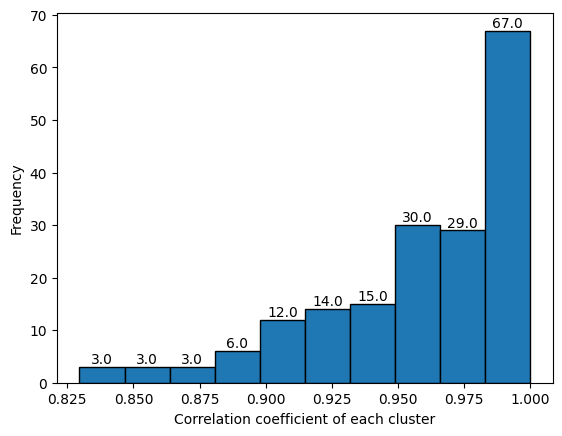

interactive(children=(ToggleButtons(description='Bins Index', options=(0, 1, 2, 3, 4, 5, 6, 7, 8, 9), value=0)…

In [26]:
# Evaluating clustered results
clust.cluster_dist()

silhouette average score : 0.580770
silhouette socre group by 
 Cluster
0      0.685663
1      0.616652
2      0.000000
3      0.603713
4      0.982601
         ...   
395    0.000000
396    0.924630
397    0.000000
398    0.000000
399    0.000000
Name: silhouette_coeff, Length: 400, dtype: float64


overlapped Cluseter Num :  [2, 14, 16, 22, 23, 30, 32, 41, 45, 56, 57, 66, 70, 75, 84, 93, 98, 99, 102, 109, 112, 113, 116, 118, 124, 126, 127, 128, 130, 131, 135, 137, 138, 139, 141, 143, 144, 147, 148, 149, 150, 152, 153, 155, 156, 161, 162, 164, 165, 166, 169, 170, 171, 173, 174, 175, 176, 177, 180, 181, 182, 183, 189, 190, 192, 195, 196, 197, 200, 202, 203, 204, 205, 206, 207, 208, 209, 211, 212, 214, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 228, 229, 231, 234, 238, 241, 242, 243, 244, 245, 246, 247, 249, 252, 253, 254, 255, 256, 258, 259, 260, 261, 263, 264, 266, 268, 269, 271, 272, 273, 274, 277, 279, 281, 283, 284, 286, 290, 291, 292, 293, 294, 295, 296, 297, 298, 300, 303,

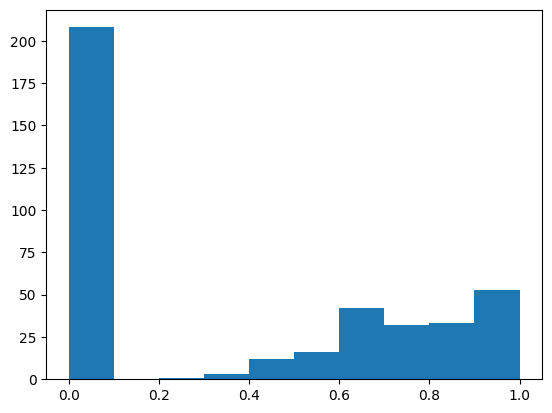

In [27]:
clust.model_evaluation()
## Silhouette Score에 계산에 해당하는 Nearest Cluster 확인하는 방법 찾아볼 것. (아직 진행하지 못함)

<h2> 2.2-2. S.O.M (Caution : Takes long time)</h2>
<h3> mt.FeatureCluster_Minisom(train_data, error, random_seed, train,neighborhood_function, topology) : Apply S.O.M Class </h3>

    * data = Train Data
    * Error = (default) qe, te
    * random_seed = (default) 0
    * train = time to init, (default) 1000
    * neighborhood_function = function weight neightborhookd of a position in mpa
        Possible : (default) 'gaussian', 'mexican_hat', 'bubble', 'triangle'
    * topology = (default) 'hexagonal', 'rectangular'
        - Error te can't use hexagonal topology
    
    Parameter_Combine(min_size,max_size) = expect #cluster n x n in range(min_size to max_size)
    
    set_cluster(map_n,sigma,lr,init) = get cluster value as array
        * map_n : map size
        * sigma
        * lr : initial learning_rate
        * init : metohd of initai weight
            Possible : 'pca', 'random'

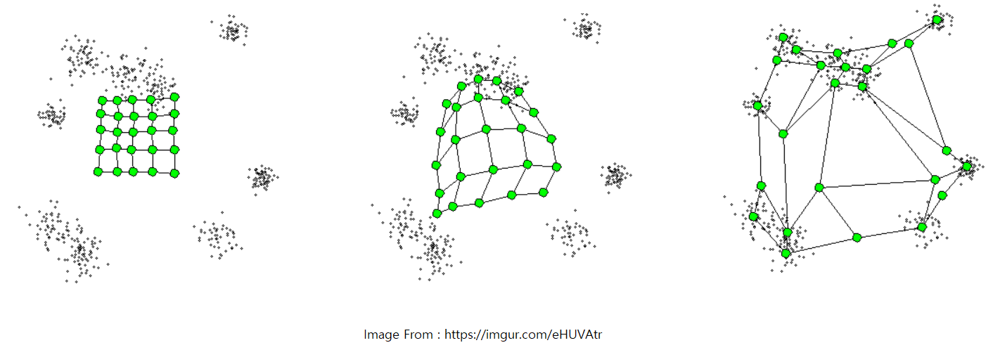

In [28]:
dt.man('som.png')

In [29]:
# S.O.M의 경우 args에 따라서 cluster의 개수가 다양하기 때문에, 해당 부분을 미리 확인해보는 단계
clust = mt.FeatureCluster_Minisom(X_train)
clust.parameter_combine(18,19)

시작시간: 2023-11-26 09:58:35.976579 



/home/lab00/chemotic/pyqsar3_1/pyqsar/minisom.py:477: RuntimeWarning: invalid value encountered in sqrt
  return sqrt(-2 * cross_term + input_data_sq + weights_flat_sq.T)



종료시간: 2023-11-26 09:59:36.468606 
총 소요시간: 0 days 00:01:00.492027


,map_size,sigma,learning_rate,init_method,qe,n_cluster
0,18x18,0.3,0.9,random_init,3.398605,313
1,18x18,0.1,0.9,random_init,3.402466,317
2,18x18,0.2,0.9,random_init,3.402467,318
3,18x18,0.4,0.9,random_init,3.413176,301
4,18x18,0.3,0.8,random_init,3.453668,311
...,...,...,...,...,...,...
175,18x18,0.5,0.1,random_init,9.033194,32
176,18x18,0.4,0.1,random_init,9.228779,28
177,18x18,0.3,0.1,random_init,9.335805,29
178,18x18,0.1,0.1,random_init,9.356450,28


/home/lab00/chemotic/pyqsar3_1/pyqsar/minisom.py:477: RuntimeWarning: invalid value encountered in sqrt
  return sqrt(-2 * cross_term + input_data_sq + weights_flat_sq.T)


Quantization Error : 3.402466470199801

 Cluster 0 ['JGI2', 'JGT10'] 
 Cluster 1 ['JGI7'] 
 Cluster 2 ['AATSC0c'] 
 Cluster 3 ['ATS7s', 'ATS8s'] 
 Cluster 4 ['VE3_D'] 
 Cluster 5 ['SpAbs_D', 'SpMax_D', 'SpDiam_D', 'SpAD_D', 'LogEE_D', 'ECIndex'] 
 Cluster 6 ['ATSC7d', 'ATSC8d'] 
 Cluster 7 ['MIC5'] 
 Cluster 8 ['ATSC5s', 'SM1_Dzv', 'SM1_Dzp', 'SddsN'] 
 Cluster 9 ['NaaO', 'SaaO'] 
 Cluster 10 ['ATS3se', 'ATS3i'] 
 Cluster 11 ['GATS1se', 'GATS1pe', 'GATS1are'] 
 Cluster 12 ['AATSC2dv', 'MATS2dv'] 
 Cluster 13 ['nN', 'BCUTi-1h', 'SlogP_VSA1', 'SlogP_VSA10', 'MID_N', 'AMID_N'] 
 Cluster 14 ['ATSC1d'] 
 Cluster 15 ['ATS4se', 'ATS4pe', 'ATS4are', 'ATS4i'] 
 Cluster 16 ['MIC1', 'MIC2'] 
 Cluster 17 ['GGI4'] 
 Cluster 18 ['NsCH3', 'SsCH3'] 
 Cluster 19 ['AETA_eta_B'] 
 Cluster 20 ['SpAbs_Dzp', 'SpMax_Dzp', 'SpDiam_Dzp', 'SpAD_Dzp', 'SpMAD_Dzp', 'LogEE_Dzp'] 
 Cluster 21 ['ATSC4Z', 'ATSC4m', 'ATSC4v', 'ATSC4p', 'ATSC4i'] 
 Cluster 22 ['ATSC4c', 'ATSC4dv', 'ATSC4s', 'ATSC4se', 'ATSC4pe', 'ATSC4

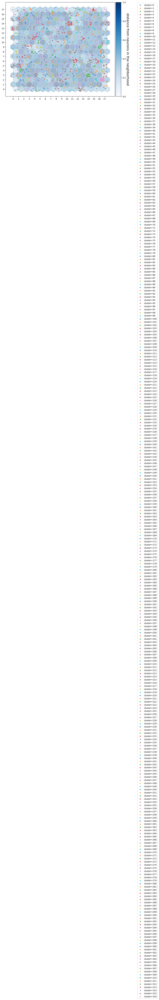

In [30]:
# SOM Clustering 
clust_info = clust.set_cluster(map_n=18,sigma=0.1,lr=0.9,init='random')

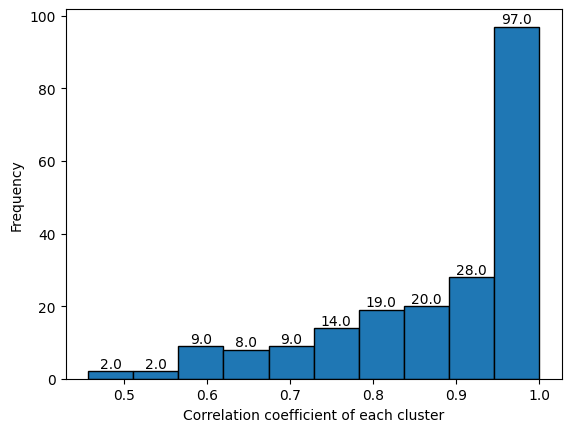

interactive(children=(ToggleButtons(description='Bins Index', options=(0, 1, 2, 3, 4, 5, 6, 7, 8, 9), value=0)…

In [31]:
# numbef of clusters within the distance range 
clust.cluster_dist()

<h2> 2.2-3. Hierarchical </h2>
<h3> mt.FeatureCluster(X_data, method, depth) : Apply S.O.M Class </h3>

    *method = linkage method
        Possible values = 'average','complete','single'
    *depth = Standard cut branch
    
    cluster_dist = clust evaluation by histogram
    set_cluster() : get cluster value as array
    

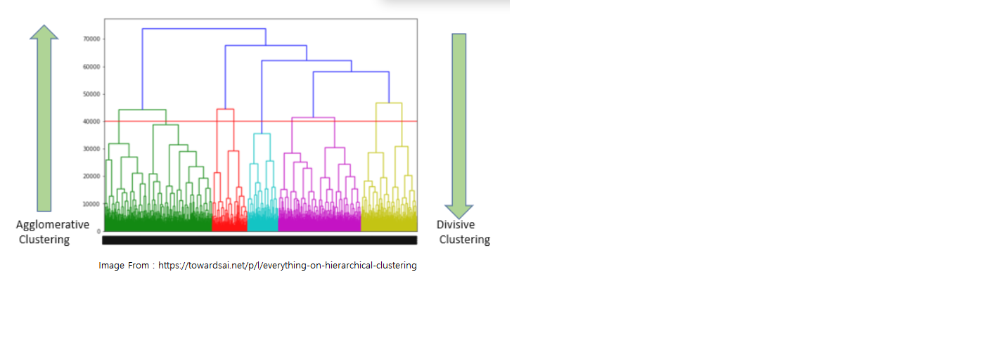

In [35]:
dt.man('hierarchical.png')

In [38]:
# Calculating Cophenet values, chose the largest one
# Not working with BLOCK split 
clust = mt.FeatureCluster(X_train)
clust.cophenetic()

average linkage cophenet: 0.8396150057107389
complete linkage cophenet: 0.8381806123277059
single linkage cophenet: 0.3625799427869468


In [39]:
# Hierarchical Clustering 
clust_info = clust.set_cluster('average',1)


 Cluster 0 ['ATS4dv'] 
 Cluster 1 ['ATS5dv'] 
 Cluster 2 ['ATS6dv'] 
 Cluster 3 ['GGI5'] 
 Cluster 4 ['ATS0dv'] 
 Cluster 5 ['ATS2s'] 
 Cluster 6 ['SpMAD_Dzv'] 
 Cluster 7 ['SpMAD_Dzp'] 
 Cluster 8 ['ATS1s'] 
 Cluster 9 ['ATS3s'] 
 Cluster 10 ['ATS4s'] 
 Cluster 11 ['ATS5s'] 
 Cluster 12 ['ATSC0dv'] 
 Cluster 13 ['ATS7Z', 'ATS7m'] 
 Cluster 14 ['GGI6'] 
 Cluster 15 ['ATS8Z', 'ATS8m'] 
 Cluster 16 ['GGI8'] 
 Cluster 17 ['GGI7'] 
 Cluster 18 ['ATS6se', 'ATS6pe', 'ATS6are'] 
 Cluster 19 ['ATS6i'] 
 Cluster 20 ['ATS7se', 'ATS8se', 'ATS7pe', 'ATS8pe', 'ATS7are', 'ATS8are', 'ATS7i', 'ATS8i'] 
 Cluster 21 ['ATS7d', 'ATS8d', 'ATS7v', 'ATS8v', 'ATS7p', 'ATS8p'] 
 Cluster 22 ['ATS7s'] 
 Cluster 23 ['ATS8s'] 
 Cluster 24 ['Diameter', 'Radius'] 
 Cluster 25 ['SpMAD_D'] 
 Cluster 26 ['mZagreb2'] 
 Cluster 27 ['Kier1'] 
 Cluster 28 ['ATS6Z', 'ATS6m'] 
 Cluster 29 ['SpAbs_Dzv', 'SpMax_Dzv', 'SpDiam_Dzv', 'SpAD_Dzv', 'LogEE_Dzv', 'SpAbs_Dzp', 'SpMax_Dzp', 'SpDiam_Dzp', 'SpAD_Dzp', 'LogEE_Dzp'] 
 Clus

 Cluster 261 ['fMF'] 
 Cluster 262 ['AETA_eta_L'] 
 Cluster 263 ['AETA_eta_FL'] 
 Cluster 264 ['FCSP3'] 
 Cluster 265 ['AETA_beta_ns'] 
 Cluster 266 ['AETA_dBeta'] 
 Cluster 267 ['CIC4', 'CIC5'] 
 Cluster 268 ['CIC3'] 
 Cluster 269 ['ATSC1v'] 
 Cluster 270 ['AATSC1p'] 
 Cluster 271 ['MATS1p'] 
 Cluster 272 ['MATS1v'] 
 Cluster 273 ['JGI4'] 
 Cluster 274 ['SIC4', 'SIC5'] 
 Cluster 275 ['SIC3', 'BIC4', 'BIC5'] 
 Cluster 276 ['BIC3'] 
 Cluster 277 ['AATSC1i'] 
 Cluster 278 ['MATS1i'] 
 Cluster 279 ['GATS1Z', 'GATS1m'] 
 Cluster 280 ['GATS1v'] 
 Cluster 281 ['GATS1p'] 
 Cluster 282 ['AETA_beta_ns_d'] 
 Cluster 283 ['SlogP_VSA7'] 
 Cluster 284 ['ETA_beta_ns_d'] 
 Cluster 285 ['ETA_dBeta'] 
 Cluster 286 ['GATS2pe', 'GATS2are'] 
 Cluster 287 ['GATS2se'] 
 Cluster 288 ['GATS2dv'] 
 Cluster 289 ['GATS2s'] 
 Cluster 290 ['ATSC1se', 'ATSC1are'] 
 Cluster 291 ['ATSC1pe', 'AATSC1are'] 
 Cluster 292 ['GATS1se', 'GATS1pe', 'GATS1are'] 
 Cluster 293 ['MATS1pe', 'MATS1are'] 
 Cluster 294 ['MATS1se'] 
 

 Cluster 524 ['ATSC6v'] 
 Cluster 525 ['ATSC6p'] 
 Cluster 526 ['VR1_A', 'VR2_A'] 
 Cluster 527 ['Xch-5d', 'Xch-5dv'] 
 Cluster 528 ['Xch-4d', 'Xch-4dv'] 
 Cluster 529 ['SMR_VSA4'] 
 Cluster 530 ['PEOE_VSA10'] 
 Cluster 531 ['NdssC'] 
 Cluster 532 ['ATSC8Z', 'ATSC8m'] 
 Cluster 533 ['ATSC8v'] 
 Cluster 534 ['ATSC8p'] 
 Cluster 535 ['ATSC8i'] 
 Cluster 536 ['ATSC7d'] 
 Cluster 537 ['EState_VSA3'] 
 Cluster 538 ['EState_VSA6'] 
 Cluster 539 ['SMR_VSA9'] 
 Cluster 540 ['SlogP_VSA11'] 
 Cluster 541 ['C3SP2'] 
 Cluster 542 ['SaasC'] 
 Cluster 543 ['EState_VSA7'] 
 Cluster 544 ['PEOE_VSA6'] 
 Cluster 545 ['AATS1dv'] 
 Cluster 546 ['AATS2dv'] 
 Cluster 547 ['AATS0dv'] 
 Cluster 548 ['SIC0'] 
 Cluster 549 ['BIC0'] 
 Cluster 550 ['CIC1'] 
 Cluster 551 ['AXp-0dv'] 
 Cluster 552 ['AXp-1dv'] 
 Cluster 553 ['MATS1s'] 
 Cluster 554 ['GATS1s'] 
 Cluster 555 ['GATS1dv'] 
 Cluster 556 ['MATS1Z', 'MATS1m'] 
 Cluster 557 ['ATSC1Z', 'ATSC1m'] 
 Cluster 558 ['AATSC1dv'] 
 Cluster 559 ['MATS1dv'] 
 Cluster 

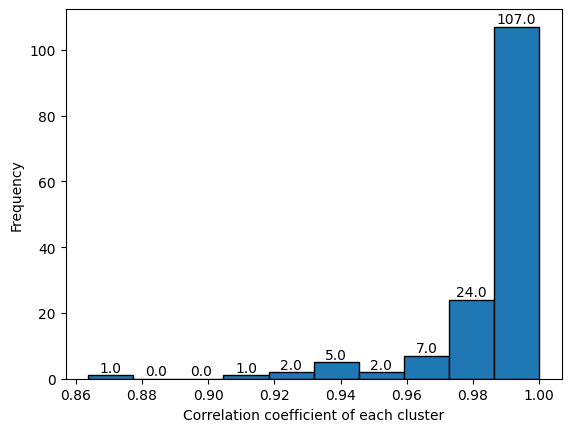

interactive(children=(ToggleButtons(description='Bins Index', options=(0, 3, 4, 5, 6, 7, 8, 9), value=0), Outp…

In [40]:
# numbef of clusters within the distance range
clust.cluster_dist()

<h1> 3. Feature Selection </h1>
<h2>  3.1. Monte Carlo </h2>

    selection(X_train, y_train, clust_info, model, pop_info, learning, bank, component, pntinterval)
    X_train : Descriptor Data
    y_train : end point
    clust_info : clustering informatino after clustering
    model : model algorithm
        Possible : 'PLS', 'MLR'
    pop_info
        None = start with empty
        population = used previous data continuously
    learning : # learning
    bank : # bank
    component : # descriptor
    pntiniterval : print value interval
    
    * return
        - select : selected feature
        - population : save point to restart

In [41]:
from pyqsar import data_tools as dt
from pyqsar import model_tools as mt
from pyqsar import draw_mol
import pandas as pd
import numpy as np

### 3.1-1 Monte Carlo Feature Selection

In [42]:
# split train data into EP and Descriptors 
X_train, y_train = mt.split_xy('.train')

Path :/home/lab00/chemotic/pyqsar3_1
Index   File Name
   0    qdb1_F_s.train
   1    qdb1_F_s_B.train
Enter .train file index to load : 1




In [43]:
# Feature Selection with MC + MLR. 
descriptor = 5
model_algo='MLR'   # MLR or PLS 
N_learning = 500
N_bank = 200
N_component = descriptor
select, population = mt.selection_mc(X_train,y_train,model=model_algo,
                                     pop_info=None,               
                                     #pop_info=population,            
                                     learning=N_learning,
                                     bank=N_bank,
                                     component=N_component,
                                     pntinterval=20 )

Start time :  10:03:40
Index   File Name
0       qdb1_F_s_B_kmeans.cluster
1       qdb1_F_s_hierarchical.cluster
2       qdb1_F_s_B_som.cluster


Enter Clust Info File Index : 0
qdb1_F_s_B_kmeans.cluster    file selected

MLR
                       R^2                  RMSE


  0%|          | 0/500 [00:00<?, ?it/s]

     20 => 10:03:57 [ 0.7353, 0.8994] ['ATS0p', 'CIC1', 'CIC5', 'SMR_VSA9', 'SlogP_VSA2']
     40 => 10:04:02 [ 0.7609, 0.8547] ['ATS0p', 'ATSC8d', 'CIC1', 'JGI9', 'SlogP_VSA2']
     60 => 10:04:07 [ 0.7700, 0.8384] ['ATS0p', 'ATSC8d', 'CIC1', 'NdsN', 'SlogP_VSA2']
     80 => 10:04:12 [ 0.7700, 0.8384] ['ATS0p', 'ATSC8d', 'CIC1', 'NdsN', 'SlogP_VSA2']
    100 => 10:04:17 [ 0.7712, 0.8362] ['ATS0p', 'ATSC8d', 'CIC1', 'NddC', 'SlogP_VSA2']
    120 => 10:04:22 [ 0.7712, 0.8362] ['ATS0p', 'ATSC8d', 'CIC1', 'NddC', 'SlogP_VSA2']
    140 => 10:04:27 [ 0.7712, 0.8362] ['ATS0p', 'ATSC8d', 'CIC1', 'NddC', 'SlogP_VSA2']
    160 => 10:04:32 [ 0.7719, 0.8349] ['ATSC4p', 'MIC1', 'NddC', 'SlogP_VSA2', 'Xp-0dv']
    180 => 10:04:37 [ 0.7719, 0.8349] ['ATSC4p', 'MIC1', 'NddC', 'SlogP_VSA2', 'Xp-0dv']
    200 => 10:04:42 [ 0.7719, 0.8349] ['ATSC4p', 'MIC1', 'NddC', 'SlogP_VSA2', 'Xp-0dv']
    220 => 10:04:47 [ 0.7719, 0.8349] ['ATSC4p', 'MIC1', 'NddC', 'SlogP_VSA2', 'Xp-0dv']
    240 => 10:04:52 [ 0.77

##### Epoch Graph

Index   File Name
0       qdb1_F_s_B_mc_MLR_kmeans.log


Enter Clust Info File Index : 0
qdb1_F_s_B_mc_MLR_kmeans.log    file selected



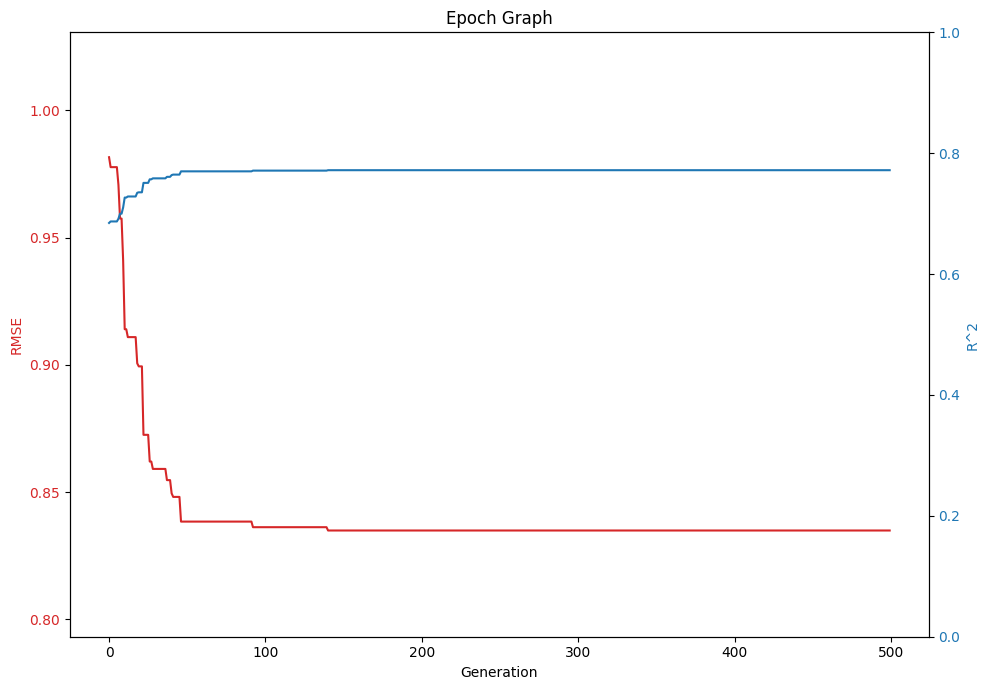

In [44]:
# Draw epoch vs. metrics
mt.Draw_epoch()

#### 3.1.2. Training with whole train set

In [45]:
model = mt.GetModel(select,model_algo,n_component=descriptor)

Path :/home/lab00/chemotic/pyqsar3_1
Index   File Name
   0    qdb1_F_s.train
   1    qdb1_F_s_B.train
Enter .train file index to load : 1




In [46]:
# training with whole train set 
model.train_plot()

Loading BokehJS ...

,ATSC4p,MIC1,NddC,SlogP_VSA2,Xp-0dv
Coef Value,0.206766,-0.349078,-0.313306,0.633987,-1.280102


<h3> 3.1.3. Train with cross validation </h3>

In [47]:
# Cross Validation 
model.k_fold() # default : k=5, run=1000

sklearn R^2CV mean: 0.772529
sklearn Q^2CV mean: 0.75944
RMSE CV : 0.851199
Features set = ['ATSC4p', 'MIC1', 'NddC', 'SlogP_VSA2', 'Xp-0dv']


#### 3.1.4. Analysis

In [48]:
# Values for selected descriptor, EP, predicted  values, Error 
model.features_table()

,ATSC4p,MIC1,NddC,SlogP_VSA2,Xp-0dv,EP,Predict,Error
ID,,,,,,,,
11859,0.400891,1.010308,-0.171398,-0.521548,-0.091129,-5.46,-5.041991,-0.418009
11899,0.160976,1.472546,-0.171398,-0.537675,-0.154874,-4.66,-5.181579,0.521579
2723704,-0.430709,-0.026408,-0.171398,0.099304,-1.029226,-3.98,-3.257571,-0.722429
3032338,0.105913,-0.062641,-0.171398,0.055038,-0.822031,-4.00,-3.427263,-0.572737
2346,0.271452,-0.094217,4.833418,-0.516730,-0.307311,-6.54,-5.971437,-0.568563
...,...,...,...,...,...,...,...,...
6348,0.375887,-0.982260,4.833418,-0.591293,-1.279054,-4.56,-4.443189,-0.116811
2723790,0.716717,-0.407856,-0.171398,-0.521028,-1.299579,-3.84,-2.934370,-0.905630
2723949,0.899870,-0.222806,-0.171398,-0.531936,-1.175735,-3.64,-3.126547,-0.513453


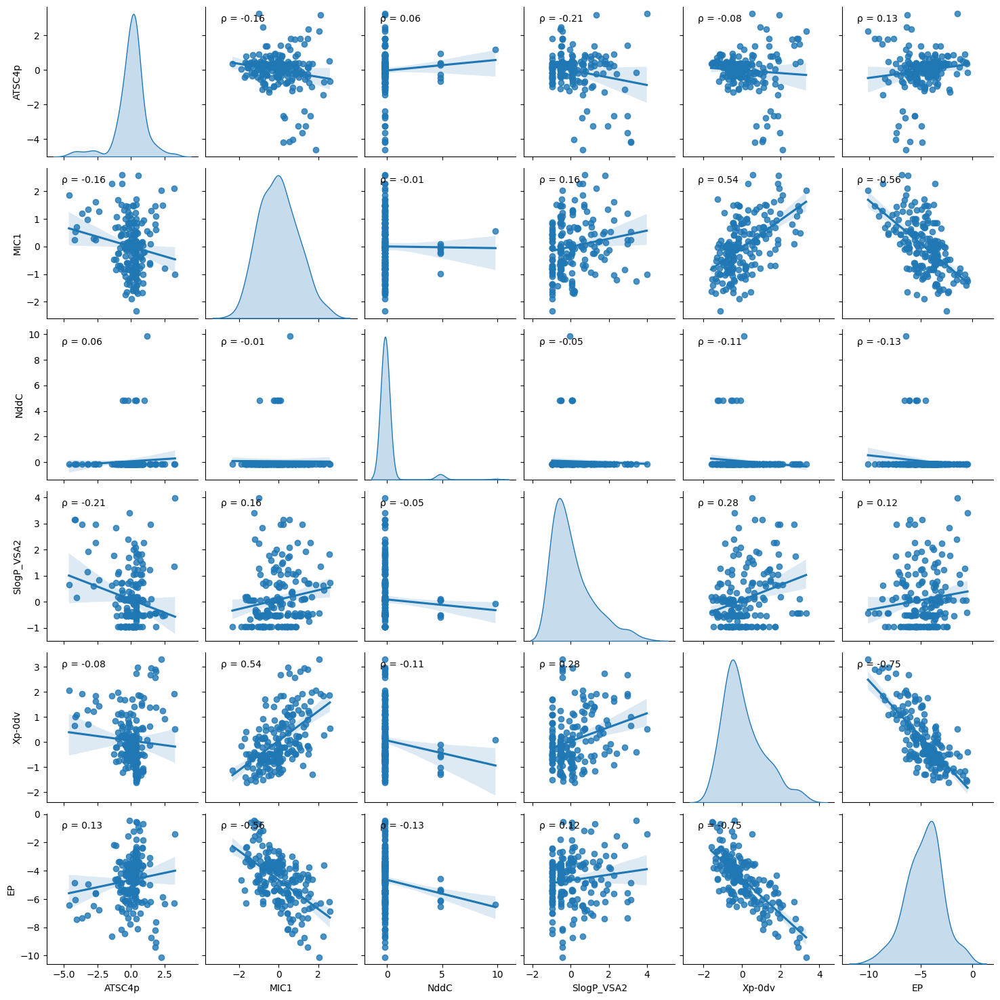

,ATSC4p,MIC1,NddC,SlogP_VSA2,Xp-0dv,EP
ATSC4p,1.000000,-0.164075,0.064593,-0.207991,-0.077051,0.128154
MIC1,-0.164075,1.000000,-0.007424,0.162557,0.540639,-0.563949
NddC,0.064593,-0.007424,1.000000,-0.045657,-0.113369,-0.130381
SlogP_VSA2,-0.207991,0.162557,-0.045657,1.000000,0.284031,0.120575
Xp-0dv,-0.077051,0.540639,-0.113369,0.284031,1.000000,-0.746864
EP,0.128154,-0.563949,-0.130381,0.120575,-0.746864,1.000000


In [49]:
# Correlation between EP and Selected Descriptors 
model.feature_corr()

Path :/home/lab00/chemotic/pyqsar3_1
Index   File Name
   0    qdb1.sdf
Enter .sdf file index to load : 0




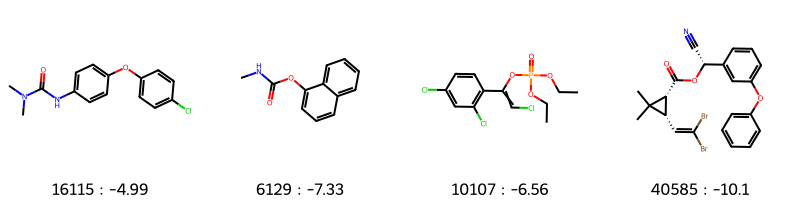

In [51]:
# Draw 2D images of selected molecules 
# to get a molecular ID, place mouse point on the dot  
mol = draw_mol.DrawMols(ID=['16115','6129','10107','40585'])
mol.show()

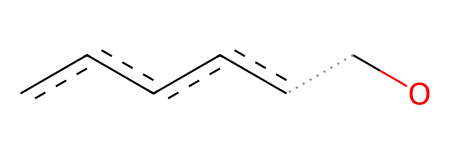

In [52]:
# maximum common substructure of selected molecules
substr = mol.common_substr()
mol.show_substr(substr)

In [53]:
# 3D Image
mol.show_3D()

interactive(children=(Dropdown(description='ID', options=('16115', '6129', '10107', '40585'), value='16115'), …

### 3.1.5. Model Save

In [45]:
model.save()

Path :/home/lab00/chemotic/pyqsar3_2311
Index   File Name
   0    qdb1_F_standard.info
Enter .info file index to load : 0


Selected Algorithm in Feature Selection (MC/GA) : MC
Selected Model (MLR/PLS) : MLR
Enter model name to  save as
(default) qdb1_F_s_B_MC_MLR.model
- : 
qdb1_F_s_B_MC_MLR.model file saved


## 4. Model Test 

#### ModelTest(test=True, scaled=True)
    * Model Test Part
    * If test is True, then show test R2, RMSE, and train/test plot
    * if test if False, Just show abut Train
    
    * Scaled False means test data is external, (not from split module) so if scaled=False, scale the test data by scale_obj above stetp

In [31]:
from pyqsar import data_tools as dt
from pyqsar import model_tools as mt
from pyqsar import draw_mol
import pandas as pd
import numpy as np

## 4.1. Test on test set

In [46]:
ModelTest = mt.ModelTest()

Path :/home/lab00/chemotic/pyqsar3_2311
Index   File Name
   0    qdb1_F_s_B_MC_MLR.model
Enter .model file index to load : 0




,BCUTv-1h,GGI7,IC1,JGI9,SLogP,Description
Row,,,,,,
Scale,0.096685,0.197733,0.286984,0.006119,0.176581,Per feature relative scaling of the data to ac...
Mean,11.769644,0.103910,1.524822,0.002938,0.148169,The mean value for each feature in the trainin...
Var,0.009348,0.039098,0.082360,0.000037,0.031181,The variance for each feature in the training set
Coef,-0.409226,-0.471619,-0.481307,0.534023,-1.038937,Coef value of each feature
Padel Index,364.000000,902.000000,698.000000,914.000000,892.000000,PaDEL descriptor index


,BCUTv-1h,GGI7,IC1,JGI9,SLogP,EP,Predict,Error
ID,,,,,,,,
11859,0.028331,-0.465178,0.401349,-0.323163,0.561997,-5.46,-5.316545,-0.143455
11899,0.027226,-0.465178,0.711151,-0.323163,0.293629,-4.66,-5.186385,0.526385
2723704,1.234236,-0.465178,0.287926,-0.323163,-1.761519,-3.98,-3.341454,-0.638546
3032338,1.234236,-0.465178,0.362413,-0.323163,-1.529287,-4.00,-3.618581,-0.381419
2346,1.234240,-0.171277,0.303436,-0.323163,-0.070823,-6.54,-5.244057,-1.295943
...,...,...,...,...,...,...,...,...
6348,1.241744,-0.465178,-2.579493,-0.323163,-0.827648,-4.56,-2.934653,-1.625347
2723790,1.234236,-0.465178,-1.157073,-0.323163,-1.916718,-3.84,-2.484725,-1.355275
2723949,1.234240,-0.465178,-0.012264,-0.323163,-1.259668,-3.64,-3.718364,0.078364


,Value
Row,
R2_CV,0.7532935524951081
Q2_CV,0.7469238592487172
RMSE_CV,0.8777418369433224
Model_Algo,MLR
Preprocessing,standard


In [47]:
ModelTest.model_test(scaled=True)

Path :/home/lab00/chemotic/pyqsar3_2311
Index   File Name
   0    qdb1_F_s_B.test
Enter .test file index to load : 0




Test R2 : 0.549690
Test RMSE : 1.208603


Path :/home/lab00/chemotic/pyqsar3_2311
Index   File Name
   0    qdb1.sdf
Enter .sdf file index to load : 0




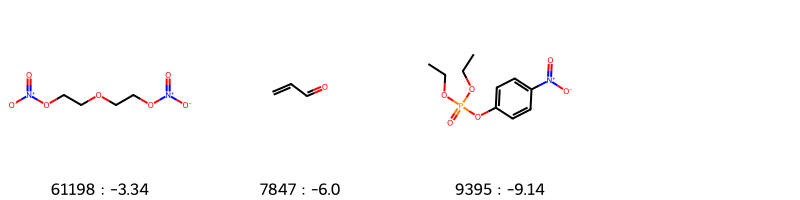

In [51]:
# Draw 2D images of selected molecules 
# to get a molecular ID, place mouse point on the dot  
mol = draw_mol.DrawMols(ID=['61198','7847','9395'])
mol.show()

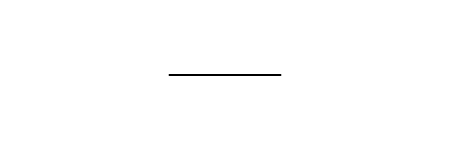

In [52]:
# maximum common substructure of selected molecules
substr = mol.common_substr()
mol.show_substr(substr)

## 4.2. Test on new molecules

In [53]:
ModelTest.editor()

Column(sizing_mode='stretch_width')
    [0] Row(sizing_mode='stretch_width')
        [0] JSMEEditor(format='smiles', height=500, sizing_mode='stretch_width')
        [1] Column(sizing_mode='stretch_width')
            [0] Param(JSMEEditor, parameters=['value'], sizing_mode='stretch_width', widgets={'value': {'type': <class ...})
            [1] Checkbox(name='New File?', sizing_mode='stretch_width', value=True)
            [2] TextAreaInput(height=30, placeholder='Enter File Name; F..., sizing_mode='fixed', width=400)
            [3] TextAreaInput(height=320, sizing_mode='fixed', value='Ready', width=400)
    [1] Button(button_type='primary', name='Evaluation', sizing_mode='stretch_width')

In [54]:
ModelTest.new_molecule('new.csv')

FileNotFoundError: [Errno 2] No such file or directory: 'new.csv'

# Below is the exmaple for Genetic Algorithm 

# Sample for GA + MLR 

### Genetic Algorithm
    selection(X_train, y_train, clust_info, clustering, model, pop_info, n_pop_size, N_generation, component)
    X_train : Descriptor Data
    y_train : end point
    clust_info : clustering informatino after clustering
    clustering : method of clustering
        Possible : 'hierarchical', 'kmeans', 'som'
    model : model algorithm
        Possible : 'PLS', 'MLR'
    pop_info
        None = start with empty
        population = used previous data continuously
    N_generation : # learning
    n_pop_size : # bank
    component : # descriptor

In [ ]:
from pyqsar import data_tools as dt
from pyqsar import model_tools as mt
from pyqsar import draw_mol
import pandas as pd
import numpy as np
# Train 데이터를 Descriptor에 해당하는 부분과 EP에 해당하는 값으로 나누는 단계
X_train, y_train = mt.split_xy('.train')

Path :/home/lab00/chemotic/pyqsar3_2311
Index   File Name
   0    qdb1_F_s_B.train


In [2]:
# GA + PLS을 이용한 Feature Selection 예
descriptor = 5
model_algo='MLR'
N_learning = 200
N_bank = 200
N_component = descriptor
select, population = mt.selection_ga(X_train,y_train,model=model_algo,
                                     pop_info=None,
                                     #pop_info=population,
                                     n_pop_size=N_bank,
                                     N_generation=N_learning,
                                     component=N_component,
                                    )

MLR
Index   File Name
0       qdb1_F_s_kmeans.cluster
1       qdb1_F_s_B_kmeans.cluster
2       qdb1_F_s_hierarchical.cluster
3       qdb1_F_s_som.cluster
4       qdb1_F_s_B_som.cluster


Enter Clust Info File Index : 0
qdb1_F_s_kmeans.cluster    file selected

---------------  Initialization  ---------------


  0%|          | 0/200 [00:00<?, ?it/s]

  1.013285   0.688364   1.117053% 
Generation        RMSD        R2      Portion
         1 :   1.013285   0.688364   0.850572% 
         2 :   1.013285   0.688364   0.699048% 
         3 :   1.009477   0.690703   0.638041% 
         4 :   0.999562   0.696749   0.610107% 
         5 :   0.999562   0.696749   0.577939% 
         6 :   0.983289   0.706542   0.563987% 
         7 :   0.980217   0.708373   0.562283% 
         8 :   0.980217   0.708373   0.526969% 
         9 :   0.963959   0.717967   0.573855% 
        10 :   0.963959   0.717967   0.563449% 
        11 :   0.960754   0.719839   0.543728% 
        12 :   0.960754   0.719839   0.548404% 
        13 :   0.942783   0.730222   0.583284% 
        14 :   0.942783   0.730222   0.578444% 
        15 :   0.942783   0.730222   0.583192% 
        16 :   0.942783   0.730222   0.550262% 
        17 :   0.942783   0.730222   0.529423% 
        18 :   0.942783   0.730222   0.517027% 
        19 :   0.942783   0.730222   0.529988% 
       

       170 :   0.886764   0.761329   0.741382% 
       171 :   0.886764   0.761329   0.718422% 
       172 :   0.886764   0.761329   0.762078% 
       173 :   0.886764   0.761329   1.846955% 
       174 :   0.886764   0.761329   1.182758% 
       175 :   0.886764   0.761329   0.922419% 
       176 :   0.884545   0.762522   0.788809% 
       177 :   0.884545   0.762522   0.735534% 
       178 :   0.884545   0.762522   0.647054% 
       179 :   0.884545   0.762522   0.648660% 
       180 :   0.884545   0.762522   0.612470% 
       181 :   0.884545   0.762522   0.628583% 
       182 :   0.884545   0.762522   0.622400% 
       183 :   0.884545   0.762522   0.617700% 
       184 :   0.884545   0.762522   0.610107% 
       185 :   0.884545   0.762522   0.613152% 
       186 :   0.884545   0.762522   0.580846% 
       187 :   0.884545   0.762522   0.590142% 
       188 :   0.884545   0.762522   0.598190% 
       189 :   0.884545   0.762522   0.616485% 
       190 :   0.884545   0.762522   0.5

#### Epoch Graph

Index   File Name
0       qdb1_F_s_ga_MLR_kmeans.log
1       qdb1_F_s_mc_MLR_kmeans.log
2       qdb1_F_s_mc_MLR_hierarchical.log
3       qdb1_F_s_B_mc_MLR_kmeans.log


Enter Clust Info File Index : 0
qdb1_F_s_ga_MLR_kmeans.log    file selected



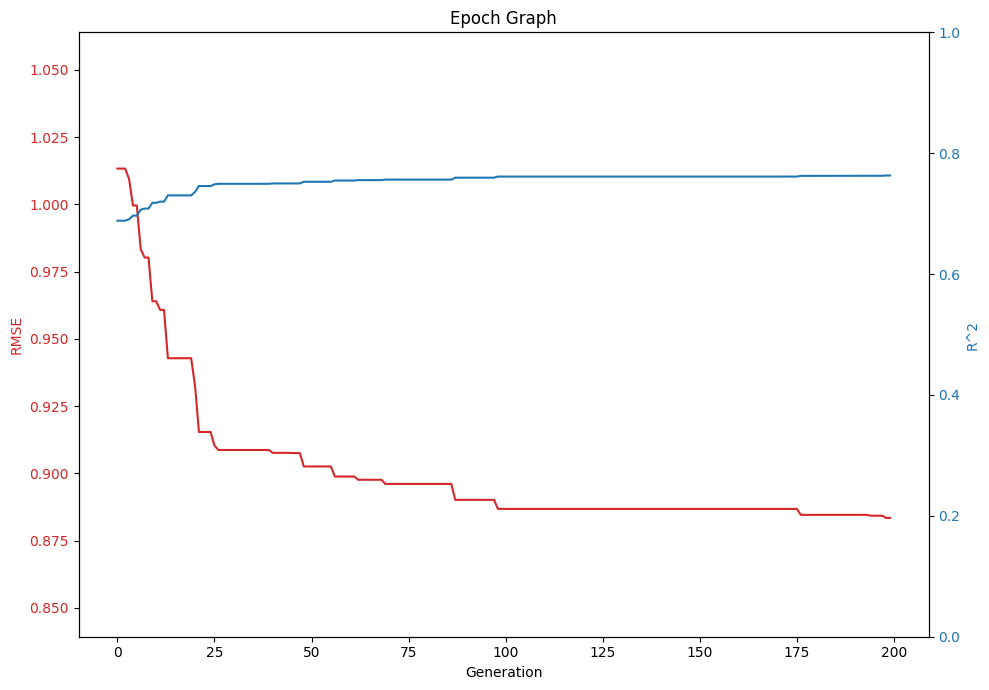

In [3]:
mt.Draw_epoch()

#### Model Information and Save

In [4]:
model = mt.GetModel(select,model_algo,descriptor)

Path :/home/lab00/chemotic/pyqsar3_2311
Index   File Name
   0    qdb1_F_s.train
   1    qdb1_F_s_B.train
Enter .train file index to load : 0




In [5]:
model.train_plot()

Loading BokehJS ...

,ATS0p,CIC1,PEOE_VSA10,SdsN,SlogP_VSA2
Coef Value,-1.711464,0.449802,-0.120002,-0.364871,0.443577


In [6]:
model.k_fold()

sklearn R^2CV mean: 0.763886
sklearn Q^2CV mean: 0.757761
RMSE CV : 0.894285
Features set = ['ATS0p', 'CIC1', 'PEOE_VSA10', 'SdsN', 'SlogP_VSA2']


In [8]:
model.features_table()

,ATS0p,CIC1,PEOE_VSA10,SdsN,SlogP_VSA2,EP,Predict,Error
ID,,,,,,,,
11899,-0.311632,-1.163405,0.496095,-0.182970,-0.537675,-4.66,-4.961448,0.301448
2723704,-0.945347,-1.321179,-0.587774,-0.182970,0.099304,-3.98,-3.535218,-0.444782
2346,-0.024834,-0.349081,-0.587774,3.500739,-0.516730,-6.54,-6.290730,-0.249270
12466,0.162137,-0.659689,-0.587774,-0.182970,-0.971021,-5.56,-5.607870,0.047870
12679,0.386944,2.483406,-0.587774,-0.182970,3.984230,-1.43,-2.380811,0.950811
...,...,...,...,...,...,...,...,...
15910,0.476543,-0.210966,2.031665,-0.182970,-0.971021,-6.21,-6.258467,0.048467
15292,-0.180799,-1.426946,0.652953,-0.182970,-0.521548,-5.65,-5.315575,-0.334425
15767,0.564199,0.066950,1.579964,-0.182970,-0.345221,-7.01,-5.951683,-1.058317


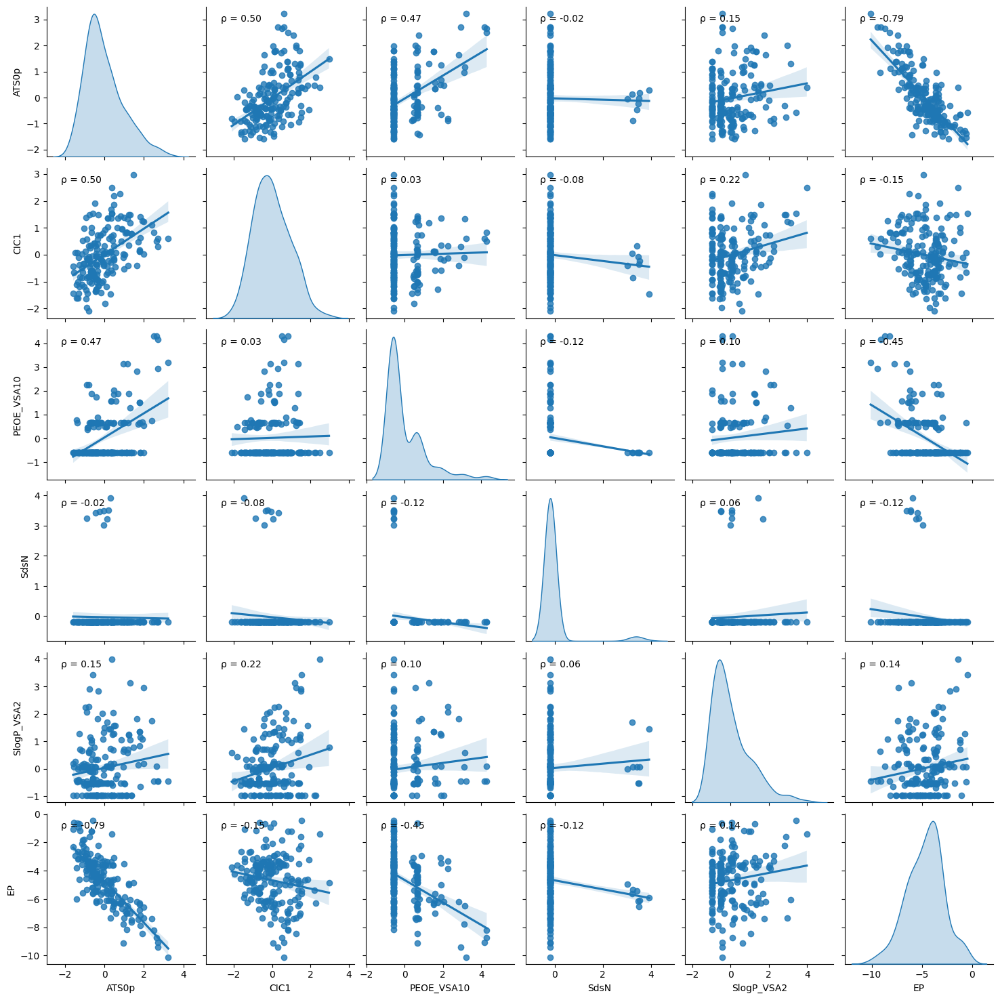

,ATS0p,CIC1,PEOE_VSA10,SdsN,SlogP_VSA2,EP
ATS0p,1.000000,0.496238,0.474623,-0.018747,0.151545,-0.786113
CIC1,0.496238,1.000000,0.025826,-0.084206,0.222851,-0.153456
PEOE_VSA10,0.474623,0.025826,1.000000,-0.121522,0.096543,-0.452589
SdsN,-0.018747,-0.084206,-0.121522,1.000000,0.055250,-0.124980
SlogP_VSA2,0.151545,0.222851,0.096543,0.055250,1.000000,0.144371
EP,-0.786113,-0.153456,-0.452589,-0.124980,0.144371,1.000000


In [9]:
model.feature_corr()

In [10]:
model.save()

Path :/home/lab00/chemotic/pyqsar3_2311
Index   File Name
   0    qdb1_F_standard.info
Enter .info file index to load : 0


Selected Algorithm in Feature Selection (MC/GA) : GA
Selected Model (MLR/PLS) : MLR
Enter model name to  save as
(default) qdb1_F_s_GA_MLR.model
- : 
qdb1_F_s_GA_MLR.model file saved


Path :/home/lab00/chemotic/pyqsar3_2311
Index   File Name
   0    qdb1.sdf
Enter .sdf file index to load : 0




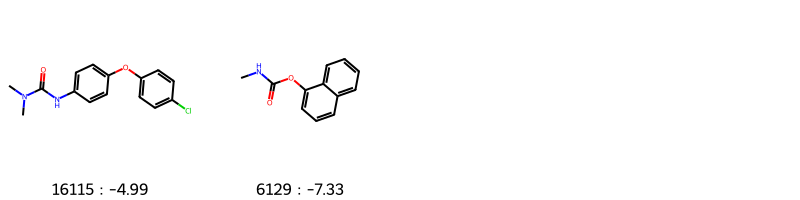

In [11]:
mol = draw_mol.DrawMols(ID=['16115','6129'])
mol.show()

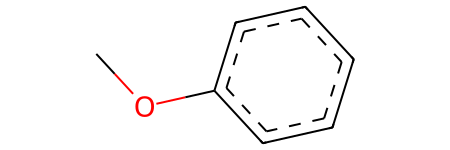

In [12]:
substr = mol.common_substr()
mol.show_substr(substr)

In [13]:
mol.show_3D()

interactive(children=(Dropdown(description='ID', options=('16115', '6129'), value='16115'), Dropdown(descripti…

## Model Information
-----------------------------------------------

In [16]:
ModelTest = mt.ModelTest()

Path :/home/lab00/chemotic/pyqsar3_2311
Index   File Name
   0    qdb1_F_s_0_0.model
   1    qdb1_F_s_GA_MLR.model
   2    qdb1_F_s_MC_MLR.model
Enter .model file index to load : 2




,ATS0p,ATSC4p,CIC1,SdsN,SlogP_VSA2,Description
Row,,,,,,
Scale,168.450423,2.187909,0.098294,0.738027,3.219289,Per feature relative scaling of the data to ac...
Mean,97.992529,0.175463,0.365123,-0.158535,1.408980,The mean value for each feature in the trainin...
Var,28375.544976,4.786944,0.009662,0.544684,10.363819,The variance for each feature in the training set
Coef,-1.783782,0.176317,0.480007,-0.325413,0.447256,Coef value of each feature
Padel Index,112.000000,257.000000,716.000000,623.000000,759.000000,PaDEL descriptor index


,ATS0p,ATSC4p,CIC1,SdsN,SlogP_VSA2,EP,Predict,Error
ID,,,,,,,,
11899,-0.311632,0.160976,-1.163405,-0.182970,-0.537675,-4.66,-4.915405,0.255405
2723704,-0.945347,-0.430709,-1.321179,-0.182970,0.099304,-3.98,-3.680158,-0.299842
2346,-0.024834,0.271452,-0.349081,3.500739,-0.516730,-6.54,-6.205990,-0.334010
12466,0.162137,0.152324,-0.659689,-0.182970,-0.971021,-5.56,-5.714060,0.154060
12679,0.386944,3.276062,2.483406,-0.182970,3.984230,-1.43,-1.839327,0.409327
...,...,...,...,...,...,...,...,...
15910,0.476543,0.203775,-0.210966,-0.182970,-0.971021,-6.21,-6.050431,-0.159569
15292,-0.180799,1.054790,-1.426946,-0.182970,-0.521548,-5.65,-5.110475,-0.539525
15767,0.564199,0.476441,0.066950,-0.182970,-0.345221,-7.01,-5.745419,-1.264581


,Value
Row,
R2_CV,0.7705313532839485
Q2_CV,0.7654804110274862
RMSE_CV,0.8896217376328588
Model_Algo,MLR
Preprocessing,standard


In [17]:
ModelTest.model_test(scaled=True)

Path :/home/lab00/chemotic/pyqsar3_2311
Index   File Name
   0    qdb1_F_s.test
   1    qdb1_F_s_B.test
Enter .test file index to load : 0




Test R2 : 0.594595
Test RMSE : 1.194804


In [18]:
ModelTest.editor()

Column(sizing_mode='stretch_width')
    [0] Row(sizing_mode='stretch_width')
        [0] JSMEEditor(format='smiles', height=500, sizing_mode='stretch_width')
        [1] Column(sizing_mode='stretch_width')
            [0] Param(JSMEEditor, parameters=['value'], sizing_mode='stretch_width', widgets={'value': {'type': <class ...})
            [1] Checkbox(name='New File?', sizing_mode='stretch_width', value=True)
            [2] TextAreaInput(height=30, placeholder='Enter File Name; F..., sizing_mode='fixed', width=400)
            [3] TextAreaInput(height=320, sizing_mode='fixed', value='Ready', width=400)
    [1] Button(button_type='primary', name='Evaluation', sizing_mode='stretch_width')

In [49]:
ModelTest.new_molecule('asdf.csv')